## This project aims to analyze two types of datasets Weather and Earthquakes.

### Inspired by research done by NASA, Can Climate Affect Earthquakes, Or Are the Connections Shaky?

#### Along with performing Exploratory Data Analysis, two hypothesis are to be answered:
1. There is a change in specific weather conditions post earthquake.
2. There is a change in specific weather conditions pre earthquake which might help us expect an earthquake to hit.

#### This project contains EDA, Visualizations and Hypothesis Testing

#### I am using APIs to retrieve data and the details of sources can be found below:
#### Data Source for Earthquake Data: https://earthquake.usgs.gov/fdsnws/event/1/
#### Data Source for Weather Data: https://dev.meteostat.net/python/daily.html

#### Importing libraries:

In [17]:
import pandas as pd
import numpy as np
import seaborn as sns       #Used for plotting visualizations
from IPython.display import Image      #Used for displaying images in notebook
from IPython.core.display import HTML 
import plotly.express as px    #Used for visualizations
import folium       #Used for map visualizations
from folium.plugins import HeatMap      #Used for map visualizations
from folium.plugins import MarkerCluster      #Used for map visualizations
from folium.plugins import FastMarkerCluster       #Used for map visualizations
from datetime import datetime
import matplotlib.pyplot as plt     #Used for visualizations
from meteostat import Stations, Daily    #This is the library using which I have retrieved weather data for specific locations 
import math                    #Used to perform statistical testing
import scipy.stats as stats      #Used to perform statistical testing
import statsmodels.api as sm        #Used to fit regression models

#### The blog which inspired me to do this project can be accessed here: https://climate.nasa.gov/news/2926/can-climate-affect-earthquakes-or-are-the-connections-shaky/

In [13]:
Image(url= "https://science.nasa.gov/wp-content/uploads/2023/11/1263_banner-science-1600x500-1.webp", width=1100)

## First, let's try to analyze Earthquake data

### Information on earthquake categories:
##### Red category means the earthquake did heavy damage
##### Orange category means the earthquake did medium damage
##### Green category means the earthquake did very little or no damage

In [14]:
#Function to retrieve data as per requirements
def get_df(alertlevel):
    formatt = 'csv'
    starttime = '1950-01-01'
    endtime = '2021-12-01'
    url_csv = 'https://earthquake.usgs.gov/fdsnws/event/1/query?format='+formatt+'&starttime='+starttime+'&endtime='+endtime+'&alertlevel='+alertlevel
    df = pd.read_csv(url_csv)
    return(df)

In [ ]:
#Organizing the data frames into categories and assigning alert level value
df_green = get_df('green')
df_orange = get_df('orange')
df_red = get_df('red')

df_green['alertLevel'] = 'Green'
df_orange['alertLevel'] = 'Orange'
df_red['alertLevel'] = 'Red'

df = df_green
df = df.append(df_orange)
df = df.append(df_red)
df

In [5]:
#Resetting index of main df containing all alert level earthquakes
df.reset_index()

,index,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,...,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource,alertLevel
0,0,2021-11-30T13:53:41.109Z,31.723000,87.929600,6.770,5.50,mww,NaN,29.0,9.59600,...,"289 km NNW of Rikaze, China",earthquake,7.40,3.70,0.093,11.0,reviewed,us,us,Green
1,1,2021-11-30T12:14:34.031Z,-3.557800,151.422100,10.000,5.80,mww,NaN,27.0,0.94200,...,"108 km NW of Rabaul, Papua New Guinea",earthquake,6.30,1.80,0.075,17.0,reviewed,us,us,Green
2,2,2021-11-30T10:37:35.539Z,-3.624900,151.352400,10.000,6.10,mww,NaN,68.0,0.98500,...,"110 km NW of Rabaul, Papua New Guinea",earthquake,8.10,1.80,0.093,11.0,reviewed,us,us,Green
3,3,2021-11-30T10:36:18.077Z,-3.522600,151.184700,10.000,6.30,mww,NaN,27.0,1.18100,...,"113 km SSE of Kavieng, Papua New Guinea",earthquake,6.60,1.80,0.050,38.0,reviewed,us,us,Green
4,4,2021-11-30T06:53:34.578Z,31.217000,142.437700,20.070,5.50,mww,NaN,54.0,2.92100,...,"Izu Islands, Japan region",earthquake,8.70,1.60,0.044,49.0,reviewed,us,us,Green
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6999,17,2014-08-24T10:20:44.070Z,38.215167,-122.312333,11.120,6.02,mw,369.0,28.0,0.03604,...,South Napa,earthquake,0.11,0.15,NaN,0.0,reviewed,nc,nc,Red
7000,18,2014-08-03T08:30:13.570Z,27.189100,103.408600,12.000,6.20,mww,NaN,13.0,2.14300,...,"33 km WSW of Zhaotong, China",earthquake,NaN,1.70,NaN,NaN,reviewed,us,us,Red
7001,19,2013-09-24T11:29:47.970Z,26.951000,65.500900,15.000,7.70,mww,NaN,17.0,7.24100,...,"113 km NW of Bela, Pakistan",earthquake,NaN,1.60,NaN,NaN,reviewed,us,us,Red
7002,20,2013-04-20T00:02:47.540Z,30.308000,102.888000,14.000,6.60,mww,548.0,12.6,NaN,...,"56 km WSW of Linqiong, China",earthquake,NaN,NaN,NaN,NaN,reviewed,us,us,Red


In [6]:
#Working only with time, latitude, longitude, depth, magnitude, magnitude type, gap, place, type and alert level columns
df = df[['time', 'latitude', 'longitude', 'depth', 'mag', 'magType', 'gap', 'place', 'type', 'alertLevel']]

In [7]:
df['alertLevel'].value_counts()

Green     6942
Orange      40
Red         22
Name: alertLevel, dtype: int64

In [8]:
#Checking the null values
df.isna().sum()

time            0
latitude        0
longitude       0
depth           0
mag             2
magType         2
gap           815
place          22
type            0
alertLevel      0
dtype: int64

In [9]:
#Performing missing value treatment
df['gap'].fillna(df['gap'].mean(), inplace=True)
df.dropna(inplace=True)
df.isna().sum()

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


time          0
latitude      0
longitude     0
depth         0
mag           0
magType       0
gap           0
place         0
type          0
alertLevel    0
dtype: int64

In [10]:
#Checking data characteristics
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6980 entries, 0 to 21
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   time        6980 non-null   object 
 1   latitude    6980 non-null   float64
 2   longitude   6980 non-null   float64
 3   depth       6980 non-null   float64
 4   mag         6980 non-null   float64
 5   magType     6980 non-null   object 
 6   gap         6980 non-null   float64
 7   place       6980 non-null   object 
 8   type        6980 non-null   object 
 9   alertLevel  6980 non-null   object 
dtypes: float64(5), object(5)
memory usage: 599.8+ KB


In [11]:
#Looking at first 5 rows
df.head()

,time,latitude,longitude,depth,mag,magType,gap,place,type,alertLevel
0,2021-11-30T13:53:41.109Z,31.7230,87.9296,6.77,5.5,mww,29.0,"289 km NNW of Rikaze, China",earthquake,Green
1,2021-11-30T12:14:34.031Z,-3.5578,151.4221,10.00,5.8,mww,27.0,"108 km NW of Rabaul, Papua New Guinea",earthquake,Green
2,2021-11-30T10:37:35.539Z,-3.6249,151.3524,10.00,6.1,mww,68.0,"110 km NW of Rabaul, Papua New Guinea",earthquake,Green
3,2021-11-30T10:36:18.077Z,-3.5226,151.1847,10.00,6.3,mww,27.0,"113 km SSE of Kavieng, Papua New Guinea",earthquake,Green
4,2021-11-30T06:53:34.578Z,31.2170,142.4377,20.07,5.5,mww,54.0,"Izu Islands, Japan region",earthquake,Green


In [12]:
#Describing some statistics of df content
df.describe()

,latitude,longitude,depth,mag,gap
count,6980.000000,6980.000000,6980.000000,6980.000000,6980.000000
mean,10.352997,-18.968431,48.978529,5.297372,56.286563
std,34.471171,128.572929,107.972050,0.816345,47.722193
min,-65.885300,-179.977600,-1.920000,0.100000,7.000000
25%,-17.517125,-125.190000,10.000000,4.667500,27.000000
50%,12.744550,-71.259900,11.020000,5.500000,45.000000
75%,37.569367,126.740225,35.000000,5.800000,60.200000
max,85.729000,179.966200,670.810000,8.300000,328.000000


#### In the above statistics summary, we can observe that we are getting negative depth values. To try and understand the reason look at the following cells:

In [13]:
#How many negative depth value observations do we have?
df[df['depth'] < 0].count()

time          39
latitude      39
longitude     39
depth         39
mag           39
magType       39
gap           39
place         39
type          39
alertLevel    39
dtype: int64

#### The reason behind negative depth is that we measure depth with respect to an imaginary figure surrounding the earth which is in the shape of an ellipsoid. Since the surface of earth is uneven, some points may lie outside of the imaginary figure. It is shown below:

In [14]:
Image(url= "https://prd-wret.s3.us-west-2.amazonaws.com/assets/palladium/production/s3fs-public/styles/side_image/public/thumbnails/image/geoid.png", width=800)

In [15]:
#Splitting dfs into respective categories
df_green = df[df['alertLevel'] == 'Green']
df_orange = df[df['alertLevel'] == 'Orange']
df_red = df[df['alertLevel'] == 'Red']

### Plotting scatter plot with ols regression of three categories of earthquakes:

In [16]:
#Creating a scatter plot to analyze different earthquake categories
color_discrete_map = {'Green': 'green', 'Orange': 'orange', 'Red': 'red'}
fig = px.scatter(df, x="depth", y="mag", color="alertLevel", color_discrete_map=color_discrete_map,
                 size='mag', hover_data=['mag'], trendline="ols")
fig.show()

#### From the above figure we can observe that maximum harm earthquakes tend to occur near to surface, i.e at a lesser depth.

#### There are different types of earthquake types, more information on them can be found here: https://www.usgs.gov/programs/earthquake-hazards/magnitude-types

### Analyzing green category earthquakes:

In [17]:
#Creating a scatter plot to analyse green categories earthquake with respect to depth
fig = px.scatter(df_green, x="depth", y="mag", color="magType",
                 size='mag', hover_data=['mag'], trendline="ols")
fig.show()

### Analyzing orange category earthquakes:

In [18]:
#Creating a scatter plot to analyse orange categories earthquake with respect to depth
fig = px.scatter(df_orange, x="depth", y="mag", color="magType",
                 size='mag', hover_data=['mag'], trendline="ols")
fig.show()

### Analyzing red category earthquakes:

In [19]:
#Creating a scatter plot to analyse red categories earthquake with respect to depth
fig = px.scatter(df_red, x="depth", y="mag", color="magType",
                 size='mag', hover_data=['mag'], trendline="ols")
fig.show()

### Analyzing where the earthquakes occured:

In [20]:
#Creating an interactive map to visualize the location and magnitude of earthquakes occured category wise
m = folium.Map(location=(0, 0), zoom_start=2, tiles='cartodbpositron')

for i in range(len(df_green)):
    folium.Circle(
        location=[df_green.iloc[i]['latitude'], df_green.iloc[i]['longitude']],
        radius=df_green.iloc[i]['mag'] * 40000,
        color='white',
        fill_color = 'green',
        fill_opacity=0.1,
    ).add_to(m)
    
for i in range(len(df_orange)):
    folium.Circle(
        location=[df_orange.iloc[i]['latitude'], df_orange.iloc[i]['longitude']],
        radius=df_orange.iloc[i]['mag'] * 40000,
        color='white',
        fill_color='orange',
        fill_opacity=0.3,
    ).add_to(m)
    
for i in range(len(df_red)):
    folium.Circle(
        location=[df_red.iloc[i]['latitude'], df_red.iloc[i]['longitude']],
        radius=df_red.iloc[i]['mag'] * 40000,
        color='white',
        fill_color='red',
        fill_opacity=0.5,
    ).add_to(m)
m

### Trying to figure out why these earthquakes occured at those locations:

In [21]:
#Taking the tectonic plates geo-json data and incorporating into our earthquake data
url = 'https://raw.githubusercontent.com/fraxen/tectonicplates/master/GeoJSON/PB2002_boundaries.json'

folium.GeoJson(
    url,
    name='geojson'
).add_to(m)

folium.LayerControl().add_to(m)

m

#### We can observe that there are earthquakes where the tectonic plates meet with each other. That is the reason behind those specific locations of earthquakes.

### Plotting interactive heatmaps of red category earthquakes:

In [22]:
#Using folium library to plot heatmaps
n = folium.Map(location=(0, 0), tiles='Cartodb dark_matter', zoom_start=2)

heat_data = [[row['latitude'],row['longitude']] for index, row in df_red.iterrows()]
HeatMap(heat_data).add_to(n)
n

### Plotting interactive heatmaps of orange category earthquakes:

In [23]:
#Using folium library to plot heatmaps
o = folium.Map(location=(0, 0), tiles='Cartodb dark_matter', zoom_start=2)

heat_data = [[row['latitude'],row['longitude']] for index, row in df_orange.iterrows()]
HeatMap(heat_data).add_to(o)
o

### Plotting an interactive map where earthquakes are divided by different sections of earth:

In [24]:
#Using folium library to plot cluster maps
quake_map = folium.Map(location=[df['latitude'].mean(), 
                                df['longitude'].mean()], 
                                zoom_start=4,
                                tiles='Cartodb dark_matter')

quake_map.add_child(FastMarkerCluster(df[['latitude', 'longitude']].values.tolist()))
quake_map

## Now, let's try to analyze Weather data

### The following cell retrieves daily weather data from the nearest weather station to the latitude, longitude of the earthquake occured:

In [25]:
#This function presents the location of earthquake along with the relevant weather characteristics
def get_locandwea(df):
    
    lat_l=[]
    long_l=[]
    year_l=[]
    month_l=[]
    day_l=[]
    mag_l=[]
    place_l=[]
    
    for i in df['latitude']:
        lat_l.append(i)
    for i in df['longitude']:
        long_l.append(i)
    for i in df['mag']:
        mag_l.append(i)
    for i in df['time']:
        str_time = str(i)
        year_l.append(i[:4])
    for i in df['time']:
        str_time = str(i)
        month_l.append(i[5:7])
    for i in df['time']:
        str_time = str(i)
        day_l.append(i[8:10])
    for i in df['place']:
        place_l.append(i)
    
    for i in range(len(df)):
        lat=lat_l[i]
        long=long_l[i]
        start=datetime(int(year_l[i]), 1, 1)
        end=datetime(int(year_l[i]), 12, 1)
        
        # Get closest weather station
        stations = Stations()
        stations = stations.nearby(lat, long)
        stations = stations.inventory('daily', (start, end))
        station = stations.fetch(1)

        # Get daily data at the selected weather station
        data = Daily(station, start, end)
        data = data.fetch()
        
        data.index = data.index.astype(str)
        
        #Plotting earthquake location on map
        m = folium.Map(location=(0, 0), zoom_start=2, tiles='cartodbpositron', title='Geo Location of Earthquake on '+str(year_l[i])+'/'+str(month_l[i])+'/'+str(day_l[i]))
        folium.Circle(
            location=[lat_l[i], long_l[i]],
            radius=mag_l[i] * 50000,
            color='white',
            fill_color = 'red',
            fill_opacity=0.5,
        ).add_to(m)
        m
        
        #Plotting the interactive temperature time series for the year earthquake hit
        fig = px.line(data, x=data.index, y=['tavg', 'tmin', 'tmax'], title='Temperature Time Series for Earthquake on '+str(year_l[i])+'/'+str(month_l[i])+'/'+str(day_l[i])+' at '+place_l[i])

        fig.update_xaxes(rangeslider_visible=True, rangeselector=dict(
                buttons=list([
                    dict(count=1, label="1m", step="month", stepmode="backward"),
                    dict(count=6, label="6m", step="month", stepmode="backward"),
                    dict(count=1, label="YTD", step="year", stepmode="todate"),
                    dict(count=1, label="1y", step="year", stepmode="backward"),
                    dict(step="all")
                ])
            ))
        fig.show()
        
        #Plotting the interactive wind speed time series for the year earthquake hit
        fig2 = px.line(data, x=data.index, y=['wspd'], title='Wind Speed Time Series for Earthquake on '+str(year_l[i])+'/'+str(month_l[i])+'/'+str(day_l[i])+' at '+place_l[i])

        fig2.update_xaxes(rangeslider_visible=True, rangeselector=dict(
                buttons=list([
                    dict(count=1, label="1m", step="month", stepmode="backward"),
                    dict(count=6, label="6m", step="month", stepmode="backward"),
                    dict(count=1, label="YTD", step="year", stepmode="todate"),
                    dict(count=1, label="1y", step="year", stepmode="backward"),
                    dict(step="all")
                ])
            ))
        fig2.show()
        
        #Plotting the interactive air pressure time series for the year earthquake hit
        fig3 = px.line(data, x=data.index, y=['pres'], title='Pressure Time Series for Earthquake on '+str(year_l[i])+'/'+str(month_l[i])+'/'+str(day_l[i])+' at '+place_l[i])

        fig3.update_xaxes(rangeslider_visible=True, rangeselector=dict(
                buttons=list([
                    dict(count=1, label="1m", step="month", stepmode="backward"),
                    dict(count=6, label="6m", step="month", stepmode="backward"),
                    dict(count=1, label="YTD", step="year", stepmode="todate"),
                    dict(count=1, label="1y", step="year", stepmode="backward"),
                    dict(step="all")
                ])
            ))
        fig3.show()

#### Here, I just plotted the weather characteristics of just one location where a red category earthquake hit.

#### It is not possible to visualize all earthquake location like this, hence I did statistical testing on the data. Because numbers speak for themselves!

### Plotting interactive time series with a range slider:

In [26]:
#Calling the function created above with just one observation. Because it is not feasible to visualize all earthquakes like this
get_locandwea(df_red.head(1))

## Now, performing statistical tests on the weather data procured for locations on times an earthquake hit:

### For performing statistical tests, I have taken the following variables and built a custom dataframe containing those variables:

#### One day before and after max temperature
#### One day before and after min temperature
#### One day before and after wind speed
#### One day before and after air pressure

In [27]:
#Creating df containing weather characteristics which are useful for performing statistical tests
stat_df = pd.DataFrame(columns = ['Before_Tmax', 'After_Tmax', 'Before_Tmin', 'After_Tmin', 'Before_Wspd', 'After_Wspd', 'Before_Pres', 'After_Pres'])

In [28]:
#Checking if the dataframe is successfully created
stat_df

,Before_Tmax,After_Tmax,Before_Tmin,After_Tmin,Before_Wspd,After_Wspd,Before_Pres,After_Pres


#### Getting weather data for earthquakes in the red category to perform statistical tests:

In [29]:
#Getting the required weather data and appending to the stat_df for red category earthquakes, one day earlier and later data
try:
    lat_l=[]
    long_l=[]
    year_l=[]
    month_l=[]
    day_l=[]
    mag_l=[]
    place_l=[]
    for i in df_red['latitude']:
        lat_l.append(i)
    for i in df_red['longitude']:
        long_l.append(i)
    for i in df_red['mag']:
        mag_l.append(i)
    for i in df_red['time']:
        str_time = str(i)
        year_l.append(i[:4])
    for i in df_red['time']:
        str_time = str(i)
        month_l.append(i[5:7])
    for i in df_red['time']:
        str_time = str(i)
        day_l.append(i[8:10])
    for i in df_red['place']:
        place_l.append(i)

    for i in range(len(df_red)):
        lat=lat_l[i]
        long=long_l[i]
        start=datetime(int(year_l[i]), 1, 1)
        end=datetime(int(year_l[i]), 12, 1)

        # Get closest weather station
        stations = Stations()
        stations = stations.nearby(lat, long)
        stations = stations.inventory('daily', (start, end))
        station = stations.fetch(1)

        # Get daily data at the selected weather station
        data = Daily(station, start, end)
        data = data.fetch()

        data.index = data.index.astype(str)

        try:
            bef_tmax = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])-1)), 'tmax']
            aft_tmax = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])+1)), 'tmax']
        except KeyError:
            bef_tmax = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'tmax']
            aft_tmax = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'tmax']

        try:
            bef_tmin = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])-1)), 'tmin']
            aft_tmin = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])+1)), 'tmin']
        except KeyError:
            bef_tmin = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'tmin']
            aft_tmin = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'tmin']

        try:
            bef_wspd = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])-1)), 'wspd']
            aft_wspd = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])+1)), 'wspd']
        except KeyError:
            bef_wspd = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'wspd']
            aft_wspd = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'wspd']

        try:
            bef_pres = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])-1)), 'pres']
            aft_pres = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])+1)), 'pres']
        except KeyError:
            bef_pres = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'pres']
            aft_pres = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'pres']

        rw_data = [bef_tmax, aft_tmax, bef_tmin, aft_tmin, bef_wspd, aft_wspd, bef_pres, aft_pres]
        rw_data_series = pd.Series(rw_data, index = stat_df.columns)
        stat_df = stat_df.append(rw_data_series, ignore_index=True)
except KeyError:
    pass

#### Getting weather data for earthquakes in the orange category to perform statistical tests:

In [30]:
#Getting the required weather data and appending to the stat_df for orange category earthquakes, one day earlier and later data
try:
    lat_l=[]
    long_l=[]
    year_l=[]
    month_l=[]
    day_l=[]
    mag_l=[]
    place_l=[]
    for i in df_orange['latitude']:
        lat_l.append(i)
    for i in df_orange['longitude']:
        long_l.append(i)
    for i in df_orange['mag']:
        mag_l.append(i)
    for i in df_orange['time']:
        str_time = str(i)
        year_l.append(i[:4])
    for i in df_orange['time']:
        str_time = str(i)
        month_l.append(i[5:7])
    for i in df_orange['time']:
        str_time = str(i)
        day_l.append(i[8:10])
    for i in df_orange['place']:
        place_l.append(i)

    for i in range(len(df_orange)):
        lat=lat_l[i]
        long=long_l[i]
        start=datetime(int(year_l[i]), 1, 1)
        end=datetime(int(year_l[i]), 12, 1)

        # Get closest weather station
        stations = Stations()
        stations = stations.nearby(lat, long)
        stations = stations.inventory('daily', (start, end))
        station = stations.fetch(1)

        # Get daily data at the selected weather station
        data = Daily(station, start, end)
        data = data.fetch()

        data.index = data.index.astype(str)

        try:
            bef_tmax = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])-1)), 'tmax']
            aft_tmax = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])+1)), 'tmax']
        except KeyError:
            bef_tmax = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'tmax']
            aft_tmax = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'tmax']

        try:
            bef_tmin = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])-1)), 'tmin']
            aft_tmin = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])+1)), 'tmin']
        except KeyError:
            bef_tmin = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'tmin']
            aft_tmin = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'tmin']

        try:
            bef_wspd = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])-1)), 'wspd']
            aft_wspd = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])+1)), 'wspd']
        except KeyError:
            bef_wspd = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'wspd']
            aft_wspd = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'wspd']

        try:
            bef_pres = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])-1)), 'pres']
            aft_pres = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])+1)), 'pres']
        except KeyError:
            bef_pres = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'pres']
            aft_pres = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'pres']

        rw_data = [bef_tmax, aft_tmax, bef_tmin, aft_tmin, bef_wspd, aft_wspd, bef_pres, aft_pres]
        rw_data_series = pd.Series(rw_data, index = stat_df.columns)
        stat_df = stat_df.append(rw_data_series, ignore_index=True)
except KeyError:
    pass

#### Getting weather data for earthquakes in the green category to perform statistical tests:

In [31]:
#Getting the required weather data and appending to the stat_df for green category earthquakes, one day earlier and later data
try:
    lat_l=[]
    long_l=[]
    year_l=[]
    month_l=[]
    day_l=[]
    mag_l=[]
    place_l=[]
    for i in df_green['latitude']:
        lat_l.append(i)
    for i in df_green['longitude']:
        long_l.append(i)
    for i in df_green['mag']:
        mag_l.append(i)
    for i in df_green['time']:
        str_time = str(i)
        year_l.append(i[:4])
    for i in df_green['time']:
        str_time = str(i)
        month_l.append(i[5:7])
    for i in df_green['time']:
        str_time = str(i)
        day_l.append(i[8:10])
    for i in df_green['place']:
        place_l.append(i)

    for i in range(len(df_green)):
        lat=lat_l[i]
        long=long_l[i]
        start=datetime(int(year_l[i]), 1, 1)
        end=datetime(int(year_l[i]), 12, 1)

        # Get closest weather station
        stations = Stations()
        stations = stations.nearby(lat, long)
        stations = stations.inventory('daily', (start, end))
        station = stations.fetch(1)

        # Get daily data at the selected weather station
        data = Daily(station, start, end)
        data = data.fetch()

        data.index = data.index.astype(str)

        try:
            bef_tmax = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])-1)), 'tmax']
            aft_tmax = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])+1)), 'tmax']
        except KeyError:
            bef_tmax = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'tmax']
            aft_tmax = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'tmax']

        try:
            bef_tmin = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])-1)), 'tmin']
            aft_tmin = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])+1)), 'tmin']
        except KeyError:
            bef_tmin = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'tmin']
            aft_tmin = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'tmin']

        try:
            bef_wspd = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])-1)), 'wspd']
            aft_wspd = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])+1)), 'wspd']
        except KeyError:
            bef_wspd = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'wspd']
            aft_wspd = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'wspd']

        try:
            bef_pres = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])-1)), 'pres']
            aft_pres = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i])+1)), 'pres']
        except KeyError:
            bef_pres = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'pres']
            aft_pres = data.loc[year_l[i]+'-'+month_l[i]+'-'+str("{:02d}".format(int(day_l[i]))), 'pres']

        rw_data = [bef_tmax, aft_tmax, bef_tmin, aft_tmin, bef_wspd, aft_wspd, bef_pres, aft_pres]
        rw_data_series = pd.Series(rw_data, index = stat_df.columns)
        stat_df = stat_df.append(rw_data_series, ignore_index=True)
except KeyError:
    pass

#### Looking at the statistical dataframe we created:

In [32]:
#This dataframe contains the data on which we will perform statistical testing later
stat_df

,Before_Tmax,After_Tmax,Before_Tmin,After_Tmin,Before_Wspd,After_Wspd,Before_Pres,After_Pres
0,30.6,33.0,16.6,20.0,11.0,17.3,1014.6,1013.6
1,29.9,25.7,21.4,19.8,6.3,12.2,1010.0,1010.6
2,33.4,32.7,25.2,25.3,5.9,6.6,1012.0,1011.6
3,32.8,33.9,23.3,24.4,13.2,11.7,1016.5,1014.5
4,34.0,32.0,22.0,20.0,9.7,7.5,1006.9,1009.1
...,...,...,...,...,...,...,...,...
195,28.5,28.5,23.3,23.3,28.0,28.0,1015.8,1015.8
196,17.0,17.0,7.0,7.0,10.6,10.6,1010.7,1010.7
197,21.5,21.5,17.1,17.1,11.7,11.7,1021.6,1021.6
198,34.0,35.4,25.0,23.6,10.2,11.1,1007.7,1006.5


In [33]:
#Taking care of null values
stat_df.dropna(inplace=True)
stat_df

,Before_Tmax,After_Tmax,Before_Tmin,After_Tmin,Before_Wspd,After_Wspd,Before_Pres,After_Pres
0,30.6,33.0,16.6,20.0,11.0,17.3,1014.6,1013.6
1,29.9,25.7,21.4,19.8,6.3,12.2,1010.0,1010.6
2,33.4,32.7,25.2,25.3,5.9,6.6,1012.0,1011.6
3,32.8,33.9,23.3,24.4,13.2,11.7,1016.5,1014.5
4,34.0,32.0,22.0,20.0,9.7,7.5,1006.9,1009.1
...,...,...,...,...,...,...,...,...
195,28.5,28.5,23.3,23.3,28.0,28.0,1015.8,1015.8
196,17.0,17.0,7.0,7.0,10.6,10.6,1010.7,1010.7
197,21.5,21.5,17.1,17.1,11.7,11.7,1021.6,1021.6
198,34.0,35.4,25.0,23.6,10.2,11.1,1007.7,1006.5


#### We can observe there is comparatively less data available, this is because most of the earthquakes hit remote locations where the meteostat library could not find weather stations in close proximity.

In [34]:
stat_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 197 entries, 0 to 199
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Before_Tmax  197 non-null    float64
 1   After_Tmax   197 non-null    float64
 2   Before_Tmin  197 non-null    float64
 3   After_Tmin   197 non-null    float64
 4   Before_Wspd  197 non-null    float64
 5   After_Wspd   197 non-null    float64
 6   Before_Pres  197 non-null    float64
 7   After_Pres   197 non-null    float64
dtypes: float64(8)
memory usage: 13.9 KB


### Two sample T-Test:

H0: Weather characteristic before earthquake = Weather characteristic after earthquake : _No earthquake weather_

HA: Weather characteristic before earthquake != Weather characteristic after earthquake : _There is some sort of earthquake weather_

In [35]:
print("Testing T_max:")
weather1 = stats.ttest_rel(a=stat_df['Before_Tmax'],
                b=stat_df['After_Tmax']) 
print(weather1)
print("----------------------------------------------------------------------------")
print("Testing T_min:")
weather2 = stats.ttest_rel(a=stat_df['Before_Tmin'],
                b=stat_df['After_Tmin']) 
print(weather2)
print("----------------------------------------------------------------------------")
print("Testing Wspd:")
weather3 = stats.ttest_rel(a=stat_df['Before_Wspd'],
                b=stat_df['After_Wspd']) 
print(weather3)
print("----------------------------------------------------------------------------")
print("Testing Pres:")
weather4 = stats.ttest_rel(a=stat_df['Before_Pres'],
                b=stat_df['After_Pres']) 
print(weather4)

Testing T_max:
Ttest_relResult(statistic=1.8802070461803924, pvalue=0.061563248081355645)
----------------------------------------------------------------------------
Testing T_min:
Ttest_relResult(statistic=-1.3201099309725344, pvalue=0.18833793947297886)
----------------------------------------------------------------------------
Testing Wspd:
Ttest_relResult(statistic=-0.33472623660481093, pvalue=0.7381895404800717)
----------------------------------------------------------------------------
Testing Pres:
Ttest_relResult(statistic=0.5355571753386975, pvalue=0.5928718017273106)


#### From above results we can see that null hypothesis stands valid, and we have to reject alternative hypothesis.

### Correlation:

In [36]:
print("Comparing T_max:")
print(np.corrcoef(stat_df.Before_Tmax, stat_df.After_Tmax))
print(stats.pearsonr(stat_df.Before_Tmax, stat_df.After_Tmax))
print("---------------------------------------------")
print("Comparing T_min:")
print(np.corrcoef(stat_df.Before_Tmin, stat_df.After_Tmin))
print(stats.pearsonr(stat_df.Before_Tmin, stat_df.After_Tmin))
print("---------------------------------------------")
print("Comparing Wspd:")
print(np.corrcoef(stat_df.Before_Wspd, stat_df.After_Wspd))
print(stats.pearsonr(stat_df.Before_Wspd, stat_df.After_Wspd))
print("---------------------------------------------")
print("Comparing Pres:")
print(np.corrcoef(stat_df.Before_Pres, stat_df.After_Pres))
print(stats.pearsonr(stat_df.Before_Pres, stat_df.After_Pres))

Comparing T_max:
[[1.         0.95338812]
 [0.95338812 1.        ]]
(0.9533881201933827, 2.0285176268935578e-103)
---------------------------------------------
Comparing T_min:
[[1.         0.96894494]
 [0.96894494 1.        ]]
(0.9689449356433153, 2.7580924889595028e-120)
---------------------------------------------
Comparing Wspd:
[[1.         0.70763698]
 [0.70763698 1.        ]]
(0.7076369818446696, 3.093058902643958e-31)
---------------------------------------------
Comparing Pres:
[[1.         0.82258241]
 [0.82258241 1.        ]]
(0.8225824056147111, 1.0822201199136479e-49)


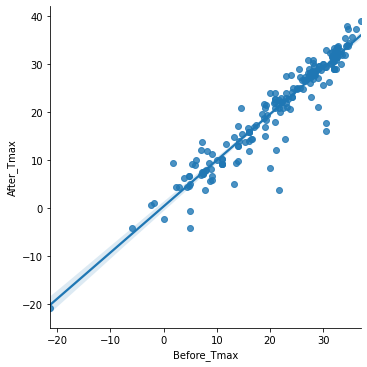

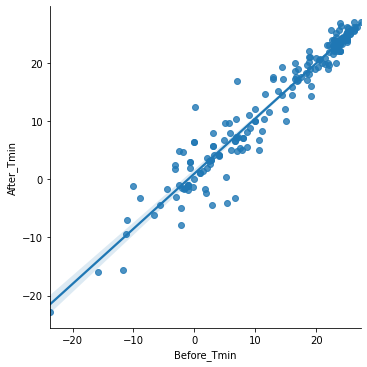

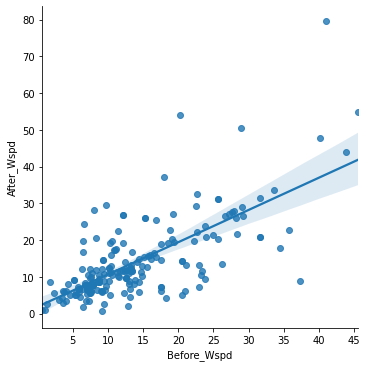

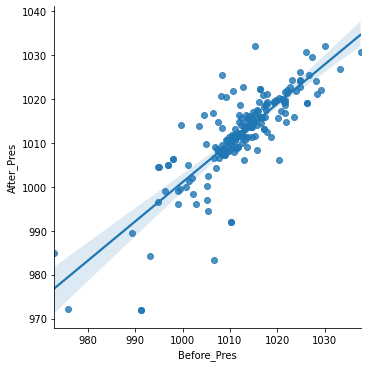

In [37]:
sns.lmplot(x = "Before_Tmax", y = "After_Tmax",data = stat_df)
sns.lmplot(x = "Before_Tmin", y = "After_Tmin",data = stat_df)
sns.lmplot(x = "Before_Wspd", y = "After_Wspd",data = stat_df)
sns.lmplot(x = "Before_Pres", y = "After_Pres",data = stat_df)

#### From above statistical numbers and graphs, we can see that there is a high correlation between before and after weather characteristics. This also means there isn't much of a change in weather to predict the change in weather post earthquake.

### Fitting an OLS Model:

In [38]:
#Fitting an OLS model on Maximum Temperature characteristic weather data
print("OLS Model on Tmax:")
Y = stat_df.Before_Tmax
X = sm.add_constant(stat_df.After_Tmax)
mod = sm.OLS(Y, X)
res = mod.fit()
res.summary()

OLS Model on Tmax:


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            Before_Tmax   R-squared:                       0.909
Model:                            OLS   Adj. R-squared:                  0.908
Method:                 Least Squares   F-statistic:                     1947.
Date:                Tue, 14 Dec 2021   Prob (F-statistic):          2.03e-103
Time:                        20:42:59   Log-Likelihood:                -503.12
No. Observations:                 197   AIC:                             1010.
Df Residuals:                     195   BIC:                             1017.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.5761      0.500      3.155      0.002       0.591       2.561
After_Tmax     0.9449      0.021     44.121      0.000       0.903       0.987
==============================================================================
Omnibus:                       86.639   Durbin-Watson:                   1.774
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              450.563
Skew:                           1.617   Prob(JB):                     1.45e-98
Kurtosis:                       9.666   Cond. No.                         52.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### From above results, it is interesting to note that we can predict post earthquake maximum temperature with 90% accuracy.

In [39]:
#Fitting an OLS model on Minimum Temperature characteristic weather data
print("OLS Model on Tmin:")
Y = stat_df.Before_Tmin
X = sm.add_constant(stat_df.After_Tmin)
mod = sm.OLS(Y, X)
res = mod.fit()
res.summary()

OLS Model on Tmin:


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            Before_Tmin   R-squared:                       0.939
Model:                            OLS   Adj. R-squared:                  0.939
Method:                 Least Squares   F-statistic:                     2994.
Date:                Tue, 14 Dec 2021   Prob (F-statistic):          2.76e-120
Time:                        20:42:59   Log-Likelihood:                -479.15
No. Observations:                 197   AIC:                             962.3
Df Residuals:                     195   BIC:                             968.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1429      0.313     -0.457      0.648      -0.759       0.474
After_Tmin     0.9913      0.018     54.718      0.000       0.956       1.027
==============================================================================
Omnibus:                       30.623   Durbin-Watson:                   1.873
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              123.179
Skew:                          -0.478   Prob(JB):                     1.79e-27
Kurtosis:                       6.754   Cond. No.                         27.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### From above results, it is interesting to note that we can predict post earthquake minimum temperature with 94% accuracy.

In [40]:
#Fitting an OLS model on Windspeed characteristic weather data
print("OLS Model on Wspd:")
Y = stat_df.Before_Wspd
X = sm.add_constant(stat_df.After_Wspd)
mod = sm.OLS(Y, X)
res = mod.fit()
res.summary()

OLS Model on Wspd:


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            Before_Wspd   R-squared:                       0.501
Model:                            OLS   Adj. R-squared:                  0.498
Method:                 Least Squares   F-statistic:                     195.6
Date:                Tue, 14 Dec 2021   Prob (F-statistic):           3.09e-31
Time:                        20:42:59   Log-Likelihood:                -636.40
No. Observations:                 197   AIC:                             1277.
Df Residuals:                     195   BIC:                             1283.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.8693      0.723      8.120      0.000       4.444       7.295
After_Wspd     0.5705      0.041     13.985      0.000       0.490       0.651
==============================================================================
Omnibus:                       27.299   Durbin-Watson:                   1.727
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               41.962
Skew:                           0.779   Prob(JB):                     7.73e-10
Kurtosis:                       4.638   Cond. No.                         29.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [41]:
#Fitting an OLS model on Pressure characteristic weather data
print("OLS Model on Pres:")
Y = stat_df.Before_Pres
X = sm.add_constant(stat_df.After_Pres)
mod = sm.OLS(Y, X)
res = mod.fit()
res.summary()

OLS Model on Pres:


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            Before_Pres   R-squared:                       0.677
Model:                            OLS   Adj. R-squared:                  0.675
Method:                 Least Squares   F-statistic:                     408.0
Date:                Tue, 14 Dec 2021   Prob (F-statistic):           1.08e-49
Time:                        20:42:59   Log-Likelihood:                -597.95
No. Observations:                 197   AIC:                             1200.
Df Residuals:                     195   BIC:                             1206.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        245.3316     37.964      6.462      0.000     170.460     320.204
After_Pres     0.7578      0.038     20.200      0.000       0.684       0.832
==============================================================================
Omnibus:                       15.716   Durbin-Watson:                   1.888
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               33.650
Skew:                          -0.334   Prob(JB):                     4.93e-08
Kurtosis:                       4.911   Cond. No.                     1.07e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.07e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Giving Hypothesis Results:

### My first hypothesis states 'There is a change in specific weather conditions post earthquake.'
#### This hypothesis only stands true to the point of Wind Speed characteristics and Air Pressure characteristics. There is no noticable change in the temperatures pre and post earthquakes.

#### -----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### My second hypothesis states 'There is a change in specific weather conditions pre earthquake which might help us expect an earthquake to hit.'
#### This hypothesis stands null, and it is not possible to predict any earthquakes using certain weather conditions pre earthquake.